In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns 

import plotly.io as pio
import plotly.express as px
import plotly.graph_objects as go
pio.renderers

pd.options.display.max_columns = None # to see all the columns

In [262]:
df = pd.read_csv('SteamSales_2018-01-01_to_2018-12-31 (1).csv', delimiter=';')
df.head(2)

,Date,Bundle(ID#),Bundle Name,Product(ID#),Type,Platform,Country Code,Country,Region,Gross Units Sold,Chargeback/Returns,Net Units Sold,Base Price,Sale Price,Currency,Gross Steam Sales (USD),Chargeback/Returns (USD),VAT/Tax (USD),Net Steam Sales (USD)
0,01/01/2018,-1,Direct Package Sale,31869,Retail,Windows,CN,China,Asia,8,0,8,0.0,0.0,USD,0.0,0.0,0.0,0.0
1,01/01/2018,-1,Direct Package Sale,31869,Retail,Windows,DE,Germany,Western Europe,1,0,1,0.0,0.0,USD,0.0,0.0,0.0,0.0


In [263]:
df.shape

(214336, 19)

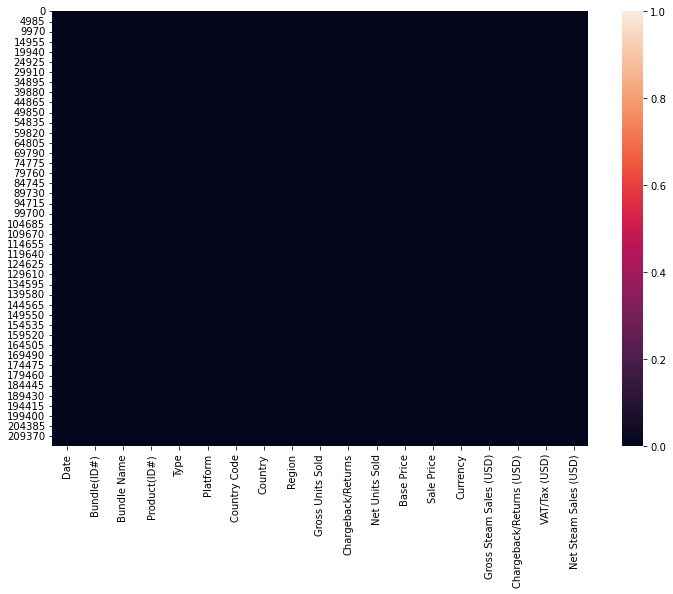

In [264]:
#check missing values
plt.figure(figsize=(12,8))
sns.heatmap(df.isnull())
plt.show()

No missing values.

In [265]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 214336 entries, 0 to 214335
Data columns (total 19 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Date                      214336 non-null  object 
 1   Bundle(ID#)               214336 non-null  int64  
 2   Bundle Name               214336 non-null  object 
 3   Product(ID#)              214336 non-null  int64  
 4   Type                      214336 non-null  object 
 5   Platform                  214336 non-null  object 
 6   Country Code              214310 non-null  object 
 7   Country                   214336 non-null  object 
 8   Region                    214336 non-null  object 
 9   Gross Units Sold          214336 non-null  int64  
 10  Chargeback/Returns        214336 non-null  int64  
 11  Net Units Sold            214336 non-null  int64  
 12  Base Price                214336 non-null  float64
 13  Sale Price                214336 non-null  f

In [266]:
df.describe(include= "all")

,Date,Bundle(ID#),Bundle Name,Product(ID#),Type,Platform,Country Code,Country,Region,Gross Units Sold,Chargeback/Returns,Net Units Sold,Base Price,Sale Price,Currency,Gross Steam Sales (USD),Chargeback/Returns (USD),VAT/Tax (USD),Net Steam Sales (USD)
count,214336,214336.000000,214336,214336.000000,214336,214336,214310,214336,214336,214336.000000,214336.000000,214336.000000,214336.000000,214336.000000,214336,214336.000000,214336.000000,214336.000000,214336.000000
unique,365,NaN,41,NaN,2,4,199,200,12,NaN,NaN,NaN,NaN,NaN,39,NaN,NaN,NaN,NaN
top,22/06/2018,NaN,Direct Package Sale,NaN,Retail,Windows,US,United States,Western Europe,NaN,NaN,NaN,NaN,NaN,USD,NaN,NaN,NaN,NaN
freq,1641,NaN,198833,NaN,135913,186355,27152,27152,75469,NaN,NaN,NaN,NaN,NaN,151258,NaN,NaN,NaN,NaN
mean,NaN,392.221386,NaN,97145.712937,NaN,NaN,NaN,NaN,NaN,4.697666,0.084909,4.612758,513.882139,298.662889,NaN,8.518405,0.824605,-0.640549,7.053252
std,NaN,1511.849409,NaN,54747.632198,NaN,NaN,NaN,NaN,NaN,83.757088,0.782897,83.711701,7317.173836,4545.228729,NaN,95.617520,8.009881,9.465263,83.756462
min,NaN,-1.000000,NaN,163.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,-12.000000,0.000000,0.000000,NaN,0.000000,0.000000,-1528.344000,-109.890000
25%,NaN,-1.000000,NaN,66182.000000,NaN,NaN,NaN,NaN,NaN,1.000000,0.000000,1.000000,0.000000,0.000000,NaN,0.000000,0.000000,0.000000,0.000000
50%,NaN,-1.000000,NaN,77126.000000,NaN,NaN,NaN,NaN,NaN,1.000000,0.000000,1.000000,0.000000,0.000000,NaN,0.000000,0.000000,0.000000,0.000000
75%,NaN,-1.000000,NaN,119229.000000,NaN,NaN,NaN,NaN,NaN,2.000000,0.000000,2.000000,10.960000,5.930000,NaN,3.660000,0.000000,0.000000,2.966200


In [267]:
df = df.drop_duplicates()
df.shape

(211189, 19)

In [268]:
df.head(2)

,Date,Bundle(ID#),Bundle Name,Product(ID#),Type,Platform,Country Code,Country,Region,Gross Units Sold,Chargeback/Returns,Net Units Sold,Base Price,Sale Price,Currency,Gross Steam Sales (USD),Chargeback/Returns (USD),VAT/Tax (USD),Net Steam Sales (USD)
0,01/01/2018,-1,Direct Package Sale,31869,Retail,Windows,CN,China,Asia,8,0,8,0.0,0.0,USD,0.0,0.0,0.0,0.0
1,01/01/2018,-1,Direct Package Sale,31869,Retail,Windows,DE,Germany,Western Europe,1,0,1,0.0,0.0,USD,0.0,0.0,0.0,0.0


In [269]:
df["Date"] = df["Date"].apply(pd.to_datetime, errors='coerce')
df.info()

C:\Users\Huy Nam TRAN\anaconda3\envs\py38\lib\site-packages\pandas\core\apply.py:138: UserWarning:

Parsing '13/01/2018' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.

C:\Users\Huy Nam TRAN\anaconda3\envs\py38\lib\site-packages\pandas\core\apply.py:138: UserWarning:

Parsing '14/01/2018' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.

C:\Users\Huy Nam TRAN\anaconda3\envs\py38\lib\site-packages\pandas\core\apply.py:138: UserWarning:

Parsing '15/01/2018' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.

C:\Users\Huy Nam TRAN\anaconda3\envs\py38\lib\site-packages\pandas\core\apply.py:138: UserWarning:

Parsing '16/01/2018' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.

C:\Users\Huy Nam TRAN\anaconda3\envs\py38\lib\site-packages\pandas\core\apply.py:138: UserWarning:

Parsing '17/01/2

<class 'pandas.core.frame.DataFrame'>
Int64Index: 211189 entries, 0 to 214335
Data columns (total 19 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   Date                      211189 non-null  datetime64[ns]
 1   Bundle(ID#)               211189 non-null  int64         
 2   Bundle Name               211189 non-null  object        
 3   Product(ID#)              211189 non-null  int64         
 4   Type                      211189 non-null  object        
 5   Platform                  211189 non-null  object        
 6   Country Code              211163 non-null  object        
 7   Country                   211189 non-null  object        
 8   Region                    211189 non-null  object        
 9   Gross Units Sold          211189 non-null  int64         
 10  Chargeback/Returns        211189 non-null  int64         
 11  Net Units Sold            211189 non-null  int64         
 12  Ba

In [270]:
print(df['Date'].max())
print(df['Date'].min())

2018-12-31 00:00:00
2018-01-01 00:00:00


In [271]:
df['quarter'] = df['Date'].dt.quarter
df['month'] = df['Date'].dt.month_name()

In [272]:
# calculate discount percentage
df["discount_%"] = ((df["Base Price"]-df["Sale Price"])/df["Base Price"])*100
df["discount_%"] = df["discount_%"].fillna(0)

In [273]:
# convert Base Price to USD
df["Base Price (USD)"] = df["Base Price"]*(df["Gross Steam Sales (USD)"]/df["Sale Price"])
df["Base Price (USD)"] = df["Base Price (USD)"].fillna(0)

In [274]:
df.head(2)

,Date,Bundle(ID#),Bundle Name,Product(ID#),Type,Platform,Country Code,Country,Region,Gross Units Sold,Chargeback/Returns,Net Units Sold,Base Price,Sale Price,Currency,Gross Steam Sales (USD),Chargeback/Returns (USD),VAT/Tax (USD),Net Steam Sales (USD),quarter,month,discount_%,Base Price (USD)
0,2018-01-01,-1,Direct Package Sale,31869,Retail,Windows,CN,China,Asia,8,0,8,0.0,0.0,USD,0.0,0.0,0.0,0.0,1,January,0.0,0.0
1,2018-01-01,-1,Direct Package Sale,31869,Retail,Windows,DE,Germany,Western Europe,1,0,1,0.0,0.0,USD,0.0,0.0,0.0,0.0,1,January,0.0,0.0


In [275]:
df.shape

(211189, 23)

In [276]:
# all the country having value count < 10 is convert to "other"
mask = df["Country"].map(df["Country"].value_counts()) < 10
df["Country"] =  df["Country"].mask(mask, "other")

In [277]:
df.shape

(211189, 23)

In [278]:
df.to_csv("new_data.csv")

In [279]:
df_country= df.groupby(["Country"]).sum()
df_country = df_country.reset_index()
df_country.head(5)

,Country,Bundle(ID#),Product(ID#),Gross Units Sold,Chargeback/Returns,Net Units Sold,Base Price,Sale Price,Gross Steam Sales (USD),Chargeback/Returns (USD),VAT/Tax (USD),Net Steam Sales (USD),quarter,discount_%,Base Price (USD)
0,Afghanistan,-21,2058373,20,2,18,11.96,6.56,3.2800,3.28,0.0,0.0000,48,180.602007,5.980000
1,Aland Islands,-25,2163681,36,1,35,79.96,71.96,64.7300,22.12,0.0,42.6100,61,40.020010,71.926220
2,Albania,-41,3346818,54,0,54,67.96,32.36,38.1220,0.00,0.0,38.1220,102,180.101730,79.712757
3,Algeria,1689,10964599,142,0,142,21.98,9.18,9.1800,0.00,0.0,9.1800,294,96.079313,21.980000
4,Andorra,5708,4668353,49,0,49,237.83,101.49,118.5758,0.00,0.0,118.5758,102,902.476406,276.685838


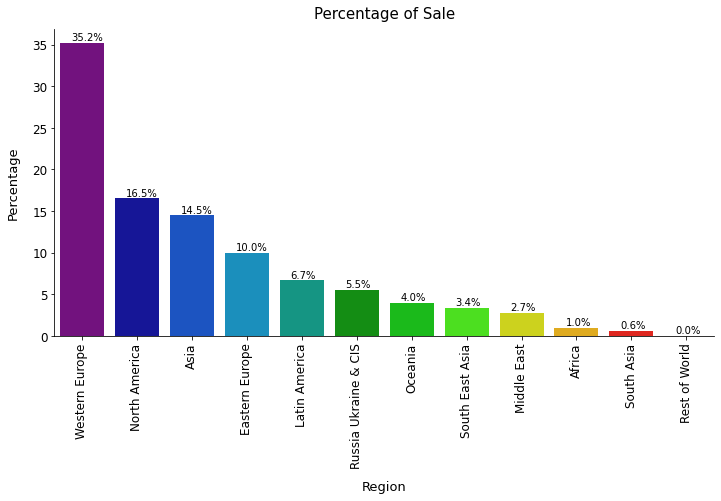

In [280]:
df_region = df["Region"].value_counts(normalize=True)
df_region = df_region.mul(100)
df_region = df_region.rename('percent').reset_index()
g = sns.catplot(data=df_region, x='index', y='percent', palette='nipy_spectral', kind = 'bar', height=5, aspect=16/8)
for p in g.ax.patches:
    txt = str(p.get_height().round(1)) + '%'
    txt_x = p.get_x() + 0.2
    txt_y = p.get_height()+0.3
    g.ax.text(txt_x,txt_y,txt)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.xlabel("Region",labelpad = 12, fontsize = 13)
plt.ylabel("Percentage",labelpad = 12, fontsize = 13)
plt.title("Percentage of Sale", fontsize = 15, pad=10)
plt.xticks(rotation=90)
plt.show()

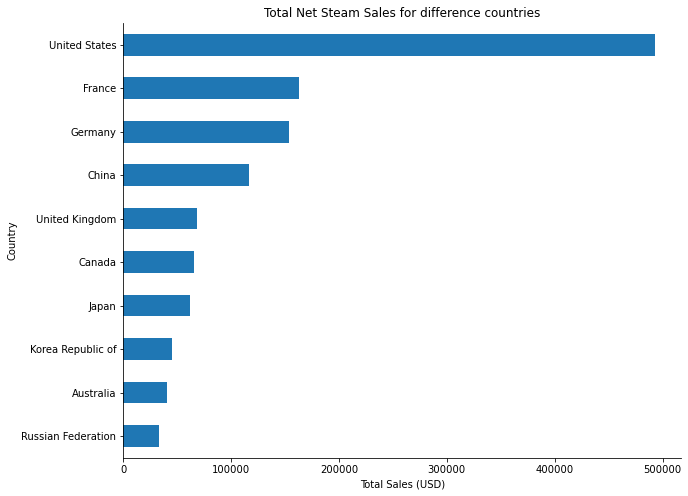

In [281]:
plt.figure(figsize=(10, 8))
platform = df.groupby("Country")["Net Steam Sales (USD)"].sum("Net Steam Sales (USD)").sort_values(ascending=False).head(10)
platform.sort_values().plot(kind='barh')
plt.xlabel("Total Sales (USD)")
plt.title("Total Net Steam Sales for difference countries")
sns.despine()

In [282]:
fig = px.density_heatmap(df, x="Region", y="Country", z="Net Steam Sales (USD)", color_continuous_scale=px.colors.sequential.Sunsetdark,
                            labels={"Region": "Region","Country": "Country"}, width=1000, height=1000)                            
fig.update_xaxes(title_font=dict(family = "Arial", size = 16, color = "black"))
fig.update_yaxes(title_font=dict(family = "Arial", size = 16, color = "black"))
fig.layout.coloraxis.colorbar.title = 'Total Sales'
fig.show()

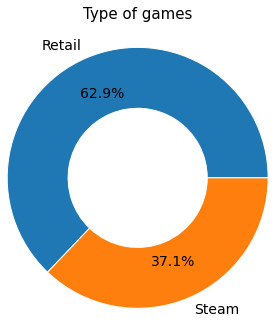

In [284]:
explode = (0.05,0.05,0.05,0.05,0.05)
plt.pie(df["Type"].value_counts().values, radius = 1.5, labels = df["Type"].value_counts().index, 
        autopct='%1.1f%%', wedgeprops=dict(width=0.7, edgecolor='w'), startangle=0, pctdistance=0.7,  textprops={'fontsize': 14})
plt.title('Type of games',pad=50, fontsize = 15)
plt.show()

In [285]:
df.head(2)

,Date,Bundle(ID#),Bundle Name,Product(ID#),Type,Platform,Country Code,Country,Region,Gross Units Sold,Chargeback/Returns,Net Units Sold,Base Price,Sale Price,Currency,Gross Steam Sales (USD),Chargeback/Returns (USD),VAT/Tax (USD),Net Steam Sales (USD),quarter,month,discount_%,Base Price (USD)
0,2018-01-01,-1,Direct Package Sale,31869,Retail,Windows,CN,China,Asia,8,0,8,0.0,0.0,USD,0.0,0.0,0.0,0.0,1,January,0.0,0.0
1,2018-01-01,-1,Direct Package Sale,31869,Retail,Windows,DE,Germany,Western Europe,1,0,1,0.0,0.0,USD,0.0,0.0,0.0,0.0,1,January,0.0,0.0


In [286]:
usefull_cols = ["Type", "Platform", "Country", "Gross Units Sold", "Net Units Sold", "Base Price (USD)", "discount_%", "VAT/Tax (USD)", "Net Steam Sales (USD)"]
df_ML = df[usefull_cols]
df_ML.head(5)

,Type,Platform,Country,Gross Units Sold,Net Units Sold,Base Price (USD),discount_%,VAT/Tax (USD),Net Steam Sales (USD)
0,Retail,Windows,China,8,8,0.000000,0.000000,0.0,0.0000
1,Retail,Windows,Germany,1,1,0.000000,0.000000,0.0,0.0000
2,Retail,Windows,United States,1,1,0.000000,0.000000,0.0,0.0000
3,Steam,Windows,Brazil,1,1,18.107043,70.011669,0.0,5.4300
4,Steam,Windows,Canada,1,1,26.263909,70.021219,0.0,7.8736


In [287]:
df_ML["Country"].value_counts(dropna=False)

United States     26471
China             15731
France            13712
Germany           13622
United Kingdom    10347
                  ...  
Curacao              11
Botswana             11
Fiji                 10
Seychelles           10
Nepal                10
Name: Country, Length: 145, dtype: int64

# Machine Learning

In [288]:
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import  OneHotEncoder, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.model_selection import cross_val_score, GridSearchCV, StratifiedKFold, KFold
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, make_scorer

## Prediction total sale

In [289]:
X = df_ML[["Type", "Platform", "Country", "Base Price (USD)", "discount_%", "VAT/Tax (USD)"]]
y = df_ML["Net Steam Sales (USD)"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=0, stratify = X["Country"])

In [290]:
print("Train data shape of X = % s and y = % s : "%(X_train.shape, y_train.shape))
print("Test data shape of X = % s and y = % s : "%(X_test.shape, y_test.shape))

Train data shape of X = (147832, 6) and y = (147832,) : 
Test data shape of X = (63357, 6) and y = (63357,) : 


In [291]:
idx = 0
numeric_features = []
numeric_indices = []
categorical_features = []
categorical_indices = []
for i,t in X.dtypes.iteritems():
    if ('float' in str(t)) or ('int' in str(t)) :
        numeric_features.append(i)
        numeric_indices.append(idx)
    else :
        categorical_features.append(i)
        categorical_indices.append(idx)

    idx = idx + 1

print('Found numeric features ', numeric_features,' at positions ', numeric_indices)
print('Found categorical features ', categorical_features,' at positions ', categorical_indices)

Found numeric features  ['Base Price (USD)', 'discount_%', 'VAT/Tax (USD)']  at positions  [3, 4, 5]
Found categorical features  ['Type', 'Platform', 'Country']  at positions  [0, 1, 2]


In [292]:
numeric_transformer = Pipeline(
    steps=[
    ('imputer', SimpleImputer(strategy='mean')), # missing values in Age will be replaced by columns' mean
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(
    steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')), # missing values will be replaced by most frequent value
    ('encoder', OneHotEncoder(drop='first')) # first column will be dropped to avoid creating correlations between features
    ])


preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_indices),
        ('cat', categorical_transformer, categorical_indices)
        ]
    )

In [293]:
X_train = X_train.values
X_test = X_test.values
y_train = y_train.tolist()
y_test = y_test.tolist()

In [294]:
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test) 

In [295]:
lr = LinearRegression()
lr.fit(X_train, y_train)
print('Train score of linear regression: {:.3f} \nTest score of linear regression: {:.3f}'.\
    format(lr.score(X_train, y_train),lr.score(X_test, y_test)))

Train score of linear regression: 0.886 
Test score of linear regression: 0.847


In [296]:
scores_lr = cross_val_score(lr, X_train, y_train, cv=10)
print('The cross-validated accuracy score of linear regression is : {:.3f}'.format(scores_lr.mean()))
print('The standard deviation of linear regression is : {:.3f}'.format(scores_lr.std()))

The cross-validated accuracy score of linear regression is : 0.883
The standard deviation of linear regression is : 0.063


In [297]:
y_train_pred_lr = lr.predict(X_train)
y_test_pred_lr = lr.predict(X_test)

In [298]:
# Print R^2 scores
print('R2 score on training set of linear regression: {:.3f} \nR2 score on test set of linear regression: {:.3f}'.\
    format(r2_score(y_train, y_train_pred_lr),r2_score(y_test, y_test_pred_lr)))

R2 score on training set of linear regression: 0.886 
R2 score on test set of linear regression: 0.847


C:\Users\Huy Nam TRAN\anaconda3\envs\py38\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



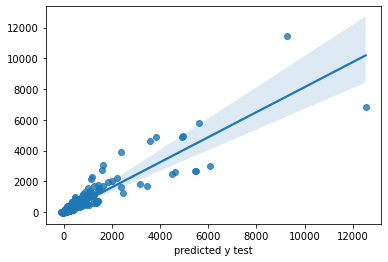

In [299]:
sns.regplot(y_test, y_test_pred_lr)
plt.xlabel("y test")
plt.xlabel("predicted y test")
plt.show()

In [300]:
preprocessor.transformers_[1][1][1].get_feature_names_out()

array(['x0_Steam', 'x1_Mac', 'x1_Unknown', 'x1_Windows',
       'x2_Aland Islands', 'x2_Albania', 'x2_Algeria', 'x2_Andorra',
       'x2_Angola', 'x2_Argentina', 'x2_Armenia', 'x2_Australia',
       'x2_Austria', 'x2_Azerbaijan', 'x2_Bahamas', 'x2_Bahrain',
       'x2_Bangladesh', 'x2_Barbados', 'x2_Belarus', 'x2_Belgium',
       'x2_Bermuda', 'x2_Bolivia', 'x2_Bosnia And Herzegowina',
       'x2_Botswana', 'x2_Brazil', 'x2_Brunei Darussalam', 'x2_Bulgaria',
       'x2_Cambodia', 'x2_Cameroon', 'x2_Canada', 'x2_Cayman Islands',
       'x2_Chile', 'x2_China', 'x2_Colombia', 'x2_Costa Rica',
       'x2_Croatia', 'x2_Curacao', 'x2_Cyprus', 'x2_Czech Republic',
       'x2_Denmark', 'x2_Dominican Republic', 'x2_Ecuador', 'x2_Egypt',
       'x2_El Salvador', 'x2_Estonia', 'x2_Faroe Islands', 'x2_Fiji',
       'x2_Finland', 'x2_France', 'x2_French Guiana',
       'x2_French Polynesia', 'x2_Georgia', 'x2_Germany', 'x2_Ghana',
       'x2_Gibraltar', 'x2_Greece', 'x2_Guadeloupe', 'x2_Guam',
    

In [301]:
preprocessed_features = numeric_features
cat_features_preprocessed = preprocessor.transformers_[1][1][1].get_feature_names_out()

preprocessed_features +=cat_features_preprocessed.tolist()
print(preprocessed_features)

['Base Price (USD)', 'discount_%', 'VAT/Tax (USD)', 'x0_Steam', 'x1_Mac', 'x1_Unknown', 'x1_Windows', 'x2_Aland Islands', 'x2_Albania', 'x2_Algeria', 'x2_Andorra', 'x2_Angola', 'x2_Argentina', 'x2_Armenia', 'x2_Australia', 'x2_Austria', 'x2_Azerbaijan', 'x2_Bahamas', 'x2_Bahrain', 'x2_Bangladesh', 'x2_Barbados', 'x2_Belarus', 'x2_Belgium', 'x2_Bermuda', 'x2_Bolivia', 'x2_Bosnia And Herzegowina', 'x2_Botswana', 'x2_Brazil', 'x2_Brunei Darussalam', 'x2_Bulgaria', 'x2_Cambodia', 'x2_Cameroon', 'x2_Canada', 'x2_Cayman Islands', 'x2_Chile', 'x2_China', 'x2_Colombia', 'x2_Costa Rica', 'x2_Croatia', 'x2_Curacao', 'x2_Cyprus', 'x2_Czech Republic', 'x2_Denmark', 'x2_Dominican Republic', 'x2_Ecuador', 'x2_Egypt', 'x2_El Salvador', 'x2_Estonia', 'x2_Faroe Islands', 'x2_Fiji', 'x2_Finland', 'x2_France', 'x2_French Guiana', 'x2_French Polynesia', 'x2_Georgia', 'x2_Germany', 'x2_Ghana', 'x2_Gibraltar', 'x2_Greece', 'x2_Guadeloupe', 'x2_Guam', 'x2_Guatemala', 'x2_Guernsey', 'x2_Honduras', 'x2_Hong Ko

In [302]:
lr.coef_

array([ 5.62883580e+01, -4.81239191e+00, -2.23328474e+01,  6.50429550e+00,
       -2.03973492e-01, -5.14136580e-01,  1.67447301e-02, -1.04575003e+00,
       -1.52302317e-01, -2.51263981e-01,  1.78881417e+00, -3.86084572e-02,
        8.93854852e-01, -1.13577067e-01, -5.70683415e-01, -1.64296995e+00,
        5.64859982e-01,  7.38089278e-01,  1.80774145e-01, -3.08255897e-02,
        9.37918608e-01, -3.44051490e-01, -1.78161870e+00, -7.50580488e-01,
        3.77943203e-01,  1.79875220e-02, -1.81121709e-01,  6.12774045e-01,
        7.20286612e-01, -6.26581011e-01,  5.82011928e-01,  2.13955791e-01,
        1.83468699e+00, -2.59013320e-01,  5.06918344e-01,  3.86301666e-02,
        5.40590031e-01,  3.29537014e-01, -5.66180720e-01, -2.59013320e-01,
       -4.09736665e-01, -8.85817774e-01, -1.89094392e+00,  8.02486300e-02,
       -2.71627628e-01,  2.52081066e-01,  1.42634434e-01, -8.93788808e-01,
        1.21565680e+00,  2.37704842e-01, -1.62196600e+00, -2.63173696e+00,
        3.10492893e+00,  

In [303]:
all_features = pd.DataFrame()
all_features['features'] = preprocessed_features
all_features['importance'] = lr.coef_
all_features.head(20)

,features,importance
0,Base Price (USD),56.288358
1,discount_%,-4.812392
2,VAT/Tax (USD),-22.332847
3,x0_Steam,6.504295
4,x1_Mac,-0.203973
5,x1_Unknown,-0.514137
6,x1_Windows,0.016745
7,x2_Aland Islands,-1.045750
8,x2_Albania,-0.152302
9,x2_Algeria,-0.251264


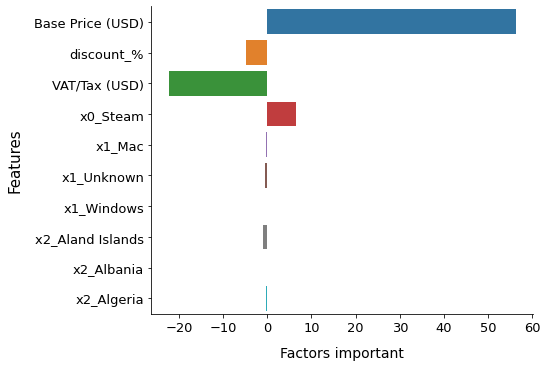

In [305]:
sns.catplot(y ='features', x='importance',data=all_features.head(10), kind="bar", aspect=1/0.7)
plt.xticks(fontsize = 13, rotation = 0)
plt.yticks(fontsize = 13, rotation = 0)
plt.xlabel("Factors important",labelpad = 12, fontsize = 14)
plt.ylabel("Features",labelpad = 12, fontsize = 15)
plt.show()

* The 2 most factors important for sale is the base price and VAT/Tax.

## Predict total sold with price # 0

In [306]:
df_ML.head(2)

,Type,Platform,Country,Gross Units Sold,Net Units Sold,Base Price (USD),discount_%,VAT/Tax (USD),Net Steam Sales (USD)
0,Retail,Windows,China,8,8,0.0,0.0,0.0,0.0
1,Retail,Windows,Germany,1,1,0.0,0.0,0.0,0.0


In [307]:
df_ML1 = df_ML[df_ML["Base Price (USD)"] != 0]
df_ML1.head(5)

,Type,Platform,Country,Gross Units Sold,Net Units Sold,Base Price (USD),discount_%,VAT/Tax (USD),Net Steam Sales (USD)
3,Steam,Windows,Brazil,1,1,18.107043,70.011669,0.0000,5.4300
4,Steam,Windows,Canada,1,1,26.263909,70.021219,0.0000,7.8736
5,Steam,Windows,China,1,0,13.504615,70.454545,0.0000,0.0000
7,Steam,Windows,United Kingdom,1,1,33.764526,70.028011,-1.6889,8.4310
8,Steam,Windows,Italy,1,1,35.927953,70.023341,-1.9408,8.8292


In [308]:
mask = df_ML1["Country"].map(df_ML1["Country"].value_counts()) < 10
df_ML1["Country"] =  df_ML1["Country"].mask(mask, 'other')

C:\Users\Huy Nam TRAN\AppData\Local\Temp\ipykernel_21308\356472851.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [309]:
df_ML1.shape

(74775, 9)

In [310]:
print(df_ML1['Gross Units Sold'].max())
print(df_ML1['Gross Units Sold'].min())

1841
1


In [311]:
df_ML1["Gross Units Sold"].info()

<class 'pandas.core.series.Series'>
Int64Index: 74775 entries, 3 to 214335
Series name: Gross Units Sold
Non-Null Count  Dtype
--------------  -----
74775 non-null  int64
dtypes: int64(1)
memory usage: 1.1 MB


In [312]:
X = df_ML1[["Type", "Platform", "Country", "Base Price (USD)", "discount_%", "VAT/Tax (USD)"]]
y = df_ML1["Net Steam Sales (USD)"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=0, stratify = X["Country"])

In [313]:
print("Train data shape of X = % s and y = % s : "%(X_train.shape, y_train.shape))
print("Test data shape of X = % s and y = % s : "%(X_test.shape, y_test.shape))

Train data shape of X = (52342, 6) and y = (52342,) : 
Test data shape of X = (22433, 6) and y = (22433,) : 


In [314]:
idx = 0
numeric_features = []
numeric_indices = []
categorical_features = []
categorical_indices = []
for i,t in X.dtypes.iteritems():
    if ('float' in str(t)) or ('int' in str(t)) :
        numeric_features.append(i)
        numeric_indices.append(idx)
    else :
        categorical_features.append(i)
        categorical_indices.append(idx)

    idx = idx + 1

print('Found numeric features ', numeric_features,' at positions ', numeric_indices)
print('Found categorical features ', categorical_features,' at positions ', categorical_indices)

Found numeric features  ['Base Price (USD)', 'discount_%', 'VAT/Tax (USD)']  at positions  [3, 4, 5]
Found categorical features  ['Type', 'Platform', 'Country']  at positions  [0, 1, 2]


In [315]:
X_train = X_train.values
X_test = X_test.values
y_train = y_train.tolist()
y_test = y_test.tolist()

In [316]:
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test) 

In [317]:
lr = LinearRegression()
lr.fit(X_train, y_train)
print('Train score of linear regression: {:.3f} \nTest score of linear regression: {:.3f}'.\
    format(lr.score(X_train, y_train),lr.score(X_test, y_test)))

Train score of linear regression: 0.871 
Test score of linear regression: 0.861


In [318]:
scores_lr = cross_val_score(lr, X_train, y_train, cv=10)
print('The cross-validated accuracy score of linear regression is : {:.3f}'.format(scores_lr.mean()))
print('The standard deviation of linear regression is : {:.3f}'.format(scores_lr.std()))

The cross-validated accuracy score of linear regression is : 0.856
The standard deviation of linear regression is : 0.062


In [319]:
y_train_pred_lr = lr.predict(X_train)
y_test_pred_lr = lr.predict(X_test)

C:\Users\Huy Nam TRAN\anaconda3\envs\py38\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



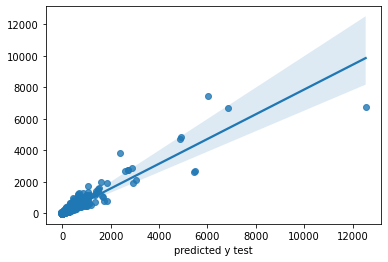

In [320]:
sns.regplot(y_test, y_test_pred_lr)
plt.xlabel("y test")
plt.xlabel("predicted y test")
plt.show()

In [321]:
preprocessed_features = numeric_features
cat_features_preprocessed = preprocessor.transformers_[1][1][1].get_feature_names_out()

preprocessed_features +=cat_features_preprocessed.tolist()
print(preprocessed_features)

['Base Price (USD)', 'discount_%', 'VAT/Tax (USD)', 'x1_Mac', 'x1_Windows', 'x2_Argentina', 'x2_Australia', 'x2_Austria', 'x2_Bahrain', 'x2_Bangladesh', 'x2_Belarus', 'x2_Belgium', 'x2_Bolivia', 'x2_Bosnia And Herzegowina', 'x2_Brazil', 'x2_Brunei Darussalam', 'x2_Bulgaria', 'x2_Cambodia', 'x2_Canada', 'x2_Chile', 'x2_China', 'x2_Colombia', 'x2_Costa Rica', 'x2_Croatia', 'x2_Cyprus', 'x2_Czech Republic', 'x2_Denmark', 'x2_Dominican Republic', 'x2_Ecuador', 'x2_Egypt', 'x2_El Salvador', 'x2_Estonia', 'x2_Faroe Islands', 'x2_Finland', 'x2_France', 'x2_Georgia', 'x2_Germany', 'x2_Greece', 'x2_Guadeloupe', 'x2_Guatemala', 'x2_Guernsey', 'x2_Hong Kong', 'x2_Hungary', 'x2_Iceland', 'x2_India', 'x2_Indonesia', 'x2_Ireland', 'x2_Isle of Man', 'x2_Israel', 'x2_Italy', 'x2_Japan', 'x2_Jersey', 'x2_Jordan', 'x2_Kazakhstan', 'x2_Korea Republic of', 'x2_Kuwait', 'x2_Latvia', 'x2_Lebanon', 'x2_Lithuania', 'x2_Luxembourg', 'x2_Macau', 'x2_Malaysia', 'x2_Malta', 'x2_Mexico', 'x2_Moldova Republic of', 

In [322]:
all_features = pd.DataFrame()
all_features['features'] = preprocessed_features
all_features['importance'] = lr.coef_
all_features.head(20)

,features,importance
0,Base Price (USD),105.271105
1,discount_%,-6.505060
2,VAT/Tax (USD),-36.741371
3,x1_Mac,-2.525021
4,x1_Windows,-0.913594
5,x2_Argentina,-2.313937
6,x2_Australia,-5.004952
7,x2_Austria,-8.034912
8,x2_Bahrain,-2.690375
9,x2_Bangladesh,-3.600343


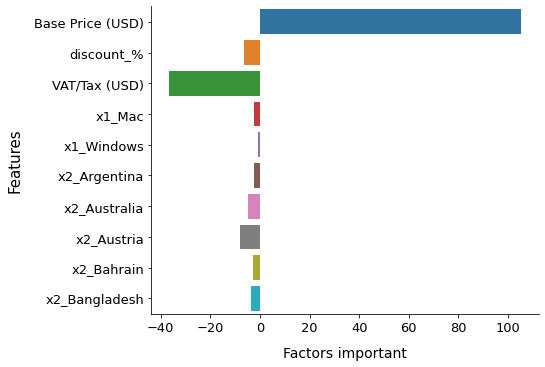

In [323]:
sns.catplot(y ='features', x='importance',data=all_features.head(10), kind="bar", aspect=1/0.7)
plt.xticks(fontsize = 13, rotation = 0)
plt.yticks(fontsize = 13, rotation = 0)
plt.xlabel("Factors important",labelpad = 12, fontsize = 14)
plt.ylabel("Features",labelpad = 12, fontsize = 15)
plt.show()

* The 2 most factors important for sale is the base price and VAT/Tax.